# Spatial joins

## Lecture objectives

1. More practice in wrangling different datasets and regular joins
2. More practice with `groupby`
3. Learn how to do spatial joins in `geopandas`


Let's think about joins in a spatial setting. Let's grab the [City of LA's food pantry dataset](https://controllerdata.lacity.org/Statistics/Food-Pantries-in-City-of-LA/uztv-ve9b) and join it to the census data. The aim: analyze the demographics of neighborhoods with food pantries.

In [2]:
import requests
import json
import geopandas as gpd
import pandas as pd
r  = requests.get('https://controllerdata.lacity.org/resource/uztv-ve9b.json')
pantryDf = pd.DataFrame(json.loads(r.content))
print(pantryDf.head())
print(pantryDf.columns)

  map_order                                               name number  \
0         1  Catholic Charities of Los Angeles - St. Robert...    211   
1         2  Los Angeles County Workforce Development, Agin...    133   
2         3                           Bienestar Human Services   5326   
3         4                     St. John's Episcopal Cathedral    514   
4         5        Sova Food Pantry and Resource Center - West   8846   

           street         city state    zip  \
0         3rd Ave  Los Angeles    CA  90291   
1      N Sunol Dr  Los Angeles    CA  90063   
2  E Beverly Blvd  Los Angeles    CA  90022   
3    W Adams Blvd  Los Angeles    CA  90007   
4     W Pico Blvd  Los Angeles    CA  90035   

                           full_address    phone_number         type  \
0          211 3rd Ave, Los Angeles, CA  (310) 392-8701  Food Pantry   
1       133 N Sunol Dr, Los Angeles, CA  (323) 260-2801  Food Pantry   
2  5326 E Beverly Blvd, Los Angeles, CA  (323) 727-7896  Food 

The Socrata API does not offer a GeoJSON for this dataset. But we do have spatial information in the `latitude` and `longitude` fields. The `gpd.points_from_xy()` function is ideal for creating geometries from these fields.

The documentation is fairly helpful. Note that while the `crs` argument (i.e., the projection) is optional, it's good practice to specify it.

In [3]:
help(gpd.points_from_xy)

Help on function points_from_xy in module geopandas.array:

points_from_xy(x, y, z=None, crs=None)
    Generate GeometryArray of shapely Point geometries from x, y(, z) coordinates.
    
    In case of geographic coordinates, it is assumed that longitude is captured by
    ``x`` coordinates and latitude by ``y``.
    
    Parameters
    ----------
    x, y, z : iterable
    crs : value, optional
        Coordinate Reference System of the geometry objects. Can be anything accepted by
        :meth:`pyproj.CRS.from_user_input() <pyproj.crs.CRS.from_user_input>`,
        such as an authority string (eg "EPSG:4326") or a WKT string.
    
    Examples
    --------
    >>> import pandas as pd
    >>> df = pd.DataFrame({'x': [0, 1, 2], 'y': [0, 1, 2], 'z': [0, 1, 2]})
    >>> df
       x  y  z
    0  0  0  0
    1  1  1  1
    2  2  2  2
    >>> geometry = geopandas.points_from_xy(x=[1, 0], y=[0, 1])
    >>> geometry = geopandas.points_from_xy(df['x'], df['y'], df['z'])
    >>> gdf = geopanda

Let's do this and turn `pantryDf` into a new GeoDataFrame, called `pantrygdf`. Notice that a new column called `geometry` is added.

In [4]:
pantrygdf = gpd.GeoDataFrame(
    pantryDf, geometry=gpd.points_from_xy(pantryDf.longitude, pantryDf.latitude, 
                                          crs='EPSG:4326'))
pantrygdf.head()

,map_order,name,number,street,city,state,zip,full_address,phone_number,type,source,latitude,longitude,geometry
0,1,Catholic Charities of Los Angeles - St. Robert...,211,3rd Ave,Los Angeles,CA,90291,"211 3rd Ave, Los Angeles, CA",(310) 392-8701,Food Pantry,Los Angeles County,33.996901,-118.47644,POINT (-118.47644 33.99690)
1,2,"Los Angeles County Workforce Development, Agin...",133,N Sunol Dr,Los Angeles,CA,90063,"133 N Sunol Dr, Los Angeles, CA",(323) 260-2801,Food Pantry,Los Angeles County,34.038686,-118.177998,POINT (-118.17800 34.03869)
2,3,Bienestar Human Services,5326,E Beverly Blvd,Los Angeles,CA,90022,"5326 E Beverly Blvd, Los Angeles, CA",(323) 727-7896,Food Pantry,Los Angeles County,34.029738,-118.149614,POINT (-118.14961 34.02974)
3,4,St. John's Episcopal Cathedral,514,W Adams Blvd,Los Angeles,CA,90007,"514 W Adams Blvd, Los Angeles, CA",(213) 747-6385,Food Pantry,Los Angeles County,34.031566,-118.283933,POINT (-118.28393 34.03157)
4,5,Sova Food Pantry and Resource Center - West,8846,W Pico Blvd,Los Angeles,CA,90035,"8846 W Pico Blvd, Los Angeles, CA",(818) 988-7682,Food Pantry,Los Angeles County,34.055414,-118.389307,POINT (-118.38931 34.05541)


We can double check that the `crs` is to our satisfaction.

In [5]:
pantrygdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

Now let's map it. The basemaps are in Web Mercator projection by default, so we need to tranform our data to that projection (`3857`). 

[]

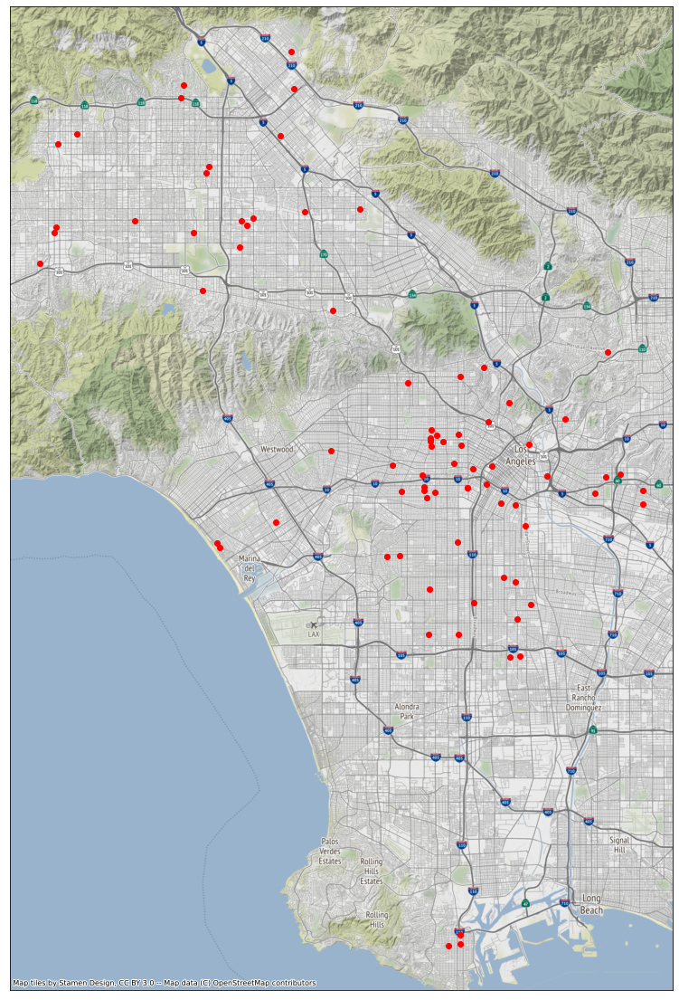

In [6]:
import contextily as ctx
import matplotlib.pyplot as plt

# Create blank figure and axes objects
fig, ax = plt.subplots(figsize=(20,20))
# Plot the data. ax=ax means we plot it on the axes that we just created
pantrygdf.to_crs('EPSG:3857').plot(color='r', ax=ax) 

# Let's add a basemap using the contextily library
# Note that we add it to the same axes object. 
# The zoom level is trial and error
ctx.add_basemap(ax, zoom=12)

# and we really don't need the axis ticks and labels, so we set them to an empty list
ax.set_xticks([])
ax.set_yticks([])

### Merging with census and EnviroScreen data
The map is nice if we just want to look at the locations. But we can't do any analysis of how food pantry locations correlate with neighborhood characteristics.

To do that, let's load in our other data sources. First, we'll use `cenpy` to get the Census data.

In [7]:
# get the census tract level data
# this should be familiar to you from previous lectures
from cenpy import products
incomeDf = products.ACS(2017).from_place('Los Angeles, CA', level='tract',
                                        variables='B19019_001E')
incomeDf.rename(columns={'B19019_001E':'median_HH_income'}, inplace=True)
incomeDf.head()

/opt/anaconda3/envs/uds/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


Matched: Los Angeles, CA to Los Angeles city within layer Incorporated Places


/opt/anaconda3/envs/uds/lib/python3.8/site-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
/var/folders/34/450ft9cs2ql94gs91xsrs7s00000gn/T/ipykernel_13934/3616786215.py:4: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  incomeDf = products.ACS(2017).from_place('Los Angeles, CA', level='tract',


,GEOID,geometry,median_HH_income,state,county,tract
0,06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900
1,06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610
2,06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903
3,06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020
4,06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201


Let's also add [EnviroScreen](https://oehha.ca.gov/calenviroscreen/maps-data/download-data) – a composite dataset focusing on environmental justice. CARB doesn't have an API, but we can download and load it.

I included the downloaded shapefile version in our class git repository. (That ensures that we are working off the same version.)

We used `gpd.read_file()` before to get a GeoJSON from the Socrata API. You can also use it to load in a file from disk.

In [8]:
enviroscreenDf = gpd.read_file('data/CalEnviroScreen/CES4 Final Shapefile.shp')
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,12.5028,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.070 -341919.191, -38126.384 -..."
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,5.3519,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.070 -341919.191, -39803.632 -..."
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,12.8857,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -..."
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,14.4128,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -..."
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,18.8872,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -..."


First, we'll do a tabular join, in the same way as the last lecture.

It looks like both datasets have the census tract. It's called `GEOID` in the census data, and `Tract` in the EnviroScreen data. So we should be able to use the pandas `.join()` to join them together.

The census data is for LA City. The EnviroScreen data is for all of California. So let's do a left join from the census data, `incomeDf`, so that we only keep the LA City census tracts.

In [9]:
# First, let's make the census tract the index, so that we can join on the index.
incomeDf.set_index('GEOID', inplace=True)
enviroscreenDf.set_index('Tract', inplace=True)

In [10]:
joinedDf = incomeDf.join(enviroscreenDf) # left join by default

ValueError: columns overlap but no suffix specified: Index(['geometry'], dtype='object')

We get our first error. The columns overlap. Remember how to do this? We could just drop that column (which we'll do here), or use the `rsuffix` argument (as we did in the last lecture).

In [11]:
joinedDf = incomeDf.join(enviroscreenDf.drop(columns='geometry')) 
joinedDf.head()

,geometry,median_HH_income,state,county,tract,ZIP,County,ApproxLoc,TotPop19,CIscore,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
GEOID,,,,,,,,,,,,,,,,,,,,,
06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


What went wrong? All the values from EnviroScreen are `NaN`.

Looking at the lengths of dataframes (i.e., number of rows) is a good place to start when troubleshooting joins.

In [12]:
print('incomeDf length: {}'.format(len(incomeDf)))
print('enviroscreenDf length: {}'.format(len(enviroscreenDf)))
print('joinedDf length: {}'.format(len(joinedDf)))

incomeDf length: 749
enviroscreenDf length: 8035
joinedDf length: 749


This looks OK. We wanted a left, 1:1 join, and we got the same number of rows in the joined dataframe as in the LA-only dataset.

`describe()` is another helpful function.

In [13]:
joinedDf.describe()

,median_HH_income,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,DieselPM,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,745.000000,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
mean,57519.527517,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,32114.005384,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,5682.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,35625.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,48793.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,71250.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,250001.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Our join was a total failure! We have no rows joined from `enviroscreenDf`.

What about looking at the join columns?

In [14]:
print(incomeDf.index)
print(enviroscreenDf.index)

Index(['06037240900', '06037294610', '06037134903', '06037131020',
       '06037115201', '06037115403', '06037132300', '06037106643',
       '06037111302', '06037132002',
       ...
       '06037186202', '06037185204', '06037203500', '06037186201',
       '06037204600', '06037199201', '06037204700', '06037203720',
       '06037204810', '06037183520'],
      dtype='object', name='GEOID', length=749)
Float64Index([6083002103.0, 6083002402.0, 6083002102.0, 6083002010.0,
              6083002009.0, 6083002008.0, 6083002007.0, 6011000500.0,
              6011000200.0, 6011000400.0,
              ...
              6037183510.0, 6037183610.0, 6037183520.0, 6037183810.0,
              6037400602.0, 6037430302.0, 6037430723.0, 6037431100.0,
              6037533603.0, 6037534101.0],
             dtype='float64', name='Tract', length=8035)


Aha. We are trying to join a string representation of the census tract FIPS codes with a numeric (floating point) representation. 

Also note that the numeric version is missing the leading zero.

Let's convert the numeric version to a string, and use the `.zfill()` function to add the leading zero. For example, `.zfill(11)` will add zeros until the string is length 11.

Let's drop the index (put it back as a regular column), as it's easier to apply functions in pandas to regular columns.

In [15]:
enviroscreenDf.reset_index(inplace=True) # get Tract back to a regular column

enviroscreenDf['GEOID'] = enviroscreenDf.Tract.astype(str).str.zfill(11)
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,GEOID
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.070 -341919.191, -38126.384 -...",6083002103.0
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.070 -341919.191, -39803.632 -...",6083002402.0
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -...",6083002102.0
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -...",6083002010.0
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -...",6083002009.0


Still not there! We captured the decimal point as well. 

Let's convert to an integer and then to a string.

In [16]:
enviroscreenDf['GEOID'] = enviroscreenDf.Tract.astype(int).astype(str).str.zfill(11)
enviroscreenDf.head()

,Tract,ZIP,County,ApproxLoc,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,...,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,geometry,GEOID
0,6.083002e+09,93454,Santa Barbara,Santa Maria,4495,36.019653,69.162885,0.034190,10.566273,7.567724,...,68.9210,20.8899,0.4004,0.2670,1.3126,6999.357689,2.847611e+06,8.2091,"POLYGON ((-39795.070 -341919.191, -38126.384 -...",06083002103
1,6.083002e+09,93455,Santa Barbara,Santa Maria,13173,37.030667,70.637922,0.035217,11.561917,7.624775,...,78.6229,13.2240,2.5051,0.0000,0.9489,19100.578232,1.635292e+07,4.6990,"POLYGON ((-39795.070 -341919.191, -39803.632 -...",06083002402
2,6.083002e+09,93454,Santa Barbara,Santa Maria,2398,31.213140,61.069087,0.034190,10.566273,7.548835,...,65.7214,30.6088,0.9591,0.0000,2.1685,4970.985897,1.352329e+06,0.5421,"POLYGON ((-38115.747 -341130.248, -38126.384 -...",06083002102
3,6.083002e+09,93455,Santa Barbara,Orcutt,4496,6.639331,5.988401,0.036244,13.615432,7.660570,...,22.9537,69.1948,0.9342,0.7117,2.5356,6558.956012,2.417717e+06,3.6699,"POLYGON ((-37341.662 -348530.437, -37252.307 -...",06083002010
4,6.083002e+09,93455,Santa Barbara,Orcutt,4008,14.022852,23.121533,0.036244,13.615432,7.663210,...,33.4082,59.7804,0.6986,1.4721,1.3723,6570.368730,2.608422e+06,3.2685,"POLYGON ((-39465.107 -348499.262, -38244.305 -...",06083002009


Looks good. Let's try the join again. Remember, `GEOID` is already the index on `incomeDf`, so we don't need to set the index again.

In [17]:
enviroscreenDf.set_index('GEOID', inplace=True)
joinedDf = incomeDf.join(enviroscreenDf.drop(columns='geometry')) 
joinedDf.head()

,geometry,median_HH_income,state,county,tract,Tract,ZIP,County,ApproxLoc,TotPop19,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
GEOID,,,,,,,,,,,,,,,,,,,,,
06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900,6.037241e+09,90059,Los Angeles,Los Angeles,6736,...,71.5707,7.1259,78.7411,0.0000,20.9768,0.0,0.0000,4343.354127,1.070549e+06,0.2821
06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610,6.037295e+09,90744,Los Angeles,Los Angeles,4334,...,66.2667,11.6521,90.2630,3.3456,1.0383,0.0,0.0000,3639.096932,8.186857e+05,5.3530
06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903,6.037135e+09,91303,Los Angeles,Los Angeles,6919,...,83.0322,3.1507,51.4525,23.0236,4.5382,0.0,3.2230,3188.439413,5.646792e+05,17.7627
06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020,6.037131e+09,91335,Los Angeles,Los Angeles,6704,...,78.4905,7.8162,69.6301,15.8264,2.9385,0.0,3.3264,5365.630029,1.449698e+06,8.2787
06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201,6.037115e+09,91324,Los Angeles,Los Angeles,6647,...,82.9096,10.5762,28.7649,51.5571,2.3469,0.0,3.0239,5544.048565,1.370260e+06,14.3072


Looks promising! Let's double check we have the right number of rows, and describe the results.

In [18]:
print('incomeDf length: {}'.format(len(incomeDf)))
print('enviroscreenDf length: {}'.format(len(enviroscreenDf)))
print('joinedDf length: {}'.format(len(joinedDf)))
joinedDf.describe()

incomeDf length: 749
enviroscreenDf length: 8035
joinedDf length: 749


,median_HH_income,Tract,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,745.000000,7.490000e+02,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,...,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,7.490000e+02,749.000000
mean,57519.527517,6.037186e+09,90604.950601,3988.829105,33.583815,64.515150,0.053630,65.977204,11.916591,74.747728,...,74.894274,10.862624,48.696573,26.324224,5.821310,-1.185128,1.210223,4148.885576,9.915066e+05,9.662838
std,32114.005384,8.377744e+04,663.932247,1294.588364,94.085572,98.190793,0.008096,20.866262,0.483710,11.896755,...,39.735962,37.371341,47.354774,45.154251,37.905167,36.509905,36.667101,2434.197376,1.248370e+06,74.397255
min,5682.000000,6.037101e+09,90002.000000,0.000000,-999.000000,-999.000000,0.038092,16.776602,10.612599,52.818917,...,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,1159.518702,7.045248e+04,-1998.000000
25%,35625.000000,6.037128e+09,90025.000000,3063.000000,30.086998,58.837620,0.046767,48.450529,11.633559,64.019913,...,73.350200,8.350000,23.419700,5.449100,1.724600,0.000000,0.739700,2746.527731,3.954638e+05,4.053500
50%,48793.000000,6.037192e+09,90057.000000,3797.000000,42.940044,79.399899,0.050230,62.526447,11.950614,75.780958,...,76.300400,11.353300,51.714200,18.823500,4.115600,0.000000,2.077600,3547.354635,6.485594e+05,9.288800
75%,71250.000000,6.037219e+09,91342.000000,4759.000000,53.087583,90.948059,0.061338,84.579963,12.108769,85.115121,...,79.375000,15.134200,73.858800,47.078100,7.939700,0.132200,3.736500,4794.189620,1.118018e+06,16.662600
max,250001.000000,6.037980e+09,91607.000000,11977.000000,77.349097,99.873928,0.068592,97.598009,14.603416,98.630989,...,100.000000,49.584500,100.000000,89.017600,69.884500,3.238900,13.647500,22720.829088,1.305864e+07,80.986200


### The spatial join

So far, our join has been non-spatial, using the tract FIPS identifier.

But how do we join the food pantry data with the merged census/EnviroScreen? 

The food pantry dataset doesn't have any geographic identifiers like census tract, just the point location.

The income/EnviroScreen data are at census tract level, so presumably we need to identify which census tract a pantry is in. Fortunately, the census data gave us the polygons of the tract boundaries (the `geometry` column).

Let's do a **spatial join**. In `geopandas`, that's accomplished using the `sjoin()` function.

The same types of join (inner, left, right, outer) apply. And you might get a 1:1 join or a 1:many join. But we can see in the documentation that the default join type is inner, not left (unlike pandas). So we'll need to specify a left join.

With spatial joins, we also have to specify the spatial relationship. We'll start with the most common - intersects, which means that the two geometries touch or overlap. We'll look at other relationships in the next lecture. If you are familiar with QGIS or ArcGIS, the terminology is the same.


In [19]:
help(gpd.sjoin)

Help on function sjoin in module geopandas.tools.sjoin:

sjoin(left_df, right_df, how='inner', predicate='intersects', lsuffix='left', rsuffix='right', **kwargs)
    Spatial join of two GeoDataFrames.
    
    See the User Guide page :doc:`../../user_guide/mergingdata` for details.
    
    
    Parameters
    ----------
    left_df, right_df : GeoDataFrames
    how : string, default 'inner'
        The type of join:
    
        * 'left': use keys from left_df; retain only left_df geometry column
        * 'right': use keys from right_df; retain only right_df geometry column
        * 'inner': use intersection of keys from both dfs; retain only
          left_df geometry column
    predicate : string, default 'intersects'
        Binary predicate. Valid values are determined by the spatial index used.
        You can check the valid values in left_df or right_df as
        ``left_df.sindex.valid_query_predicates`` or
        ``right_df.sindex.valid_query_predicates``
        Replaces 

In [20]:
pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf, how="left", predicate='intersects')
pantries_sjoin.head()

/var/folders/34/450ft9cs2ql94gs91xsrs7s00000gn/T/ipykernel_13934/3124325768.py:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: EPSG:3857
Right CRS: EPSG:4326

  pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf, how="left", predicate='intersects')


,geometry,median_HH_income,state_left,county,tract,Tract,ZIP,County,ApproxLoc,TotPop19,...,street,city,state_right,zip,full_address,phone_number,type,source,latitude,longitude
GEOID,,,,,,,,,,,,,,,,,,,,,
06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900,6.037241e+09,90059,Los Angeles,Los Angeles,6736,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610,6.037295e+09,90744,Los Angeles,Los Angeles,4334,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903,6.037135e+09,91303,Los Angeles,Los Angeles,6919,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020,6.037131e+09,91335,Los Angeles,Los Angeles,6704,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201,6.037115e+09,91324,Los Angeles,Los Angeles,6647,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We should get a warning message there. To do a spatial join, the dataframes have to be in the same projection (coordinate reference system).

If we are measuring distances, the projection matters! For example, you typically want to measure distances in meters or feet, not degrees. For intersections, they just have to be the same.

In [21]:
print(incomeDf.crs)
print(pantrygdf.crs)

+init=epsg:3857 +type=crs
EPSG:4326


It doesn't matter which one we choose. Let's reproject `pantrygdf`. 

In [22]:
pantries_sjoin = gpd.sjoin(joinedDf, pantrygdf.to_crs('EPSG:3857'), how="left", predicate='intersects')
pantries_sjoin.head()

,geometry,median_HH_income,state_left,county,tract,Tract,ZIP,County,ApproxLoc,TotPop19,...,street,city,state_right,zip,full_address,phone_number,type,source,latitude,longitude
GEOID,,,,,,,,,,,,,,,,,,,,,
06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900,6.037241e+09,90059,Los Angeles,Los Angeles,6736,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610,6.037295e+09,90744,Los Angeles,Los Angeles,4334,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903,6.037135e+09,91303,Los Angeles,Los Angeles,6919,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020,6.037131e+09,91335,Los Angeles,Los Angeles,6704,...,Sherman Way,Los Angeles,CA,91335,"18515 Sherman Way, Los Angeles, CA",(818) 631-2741,Food Pantry,Los Angeles County,34.20121,-118.539491
06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201,6.037115e+09,91324,Los Angeles,Los Angeles,6647,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Looks good. Let's do our post-join checks again.

In [23]:
print('pantrygdf length: {}'.format(len(pantrygdf)))
print('joinedDf length: {}'.format(len(joinedDf)))
print('pantries_sjoin length: {}'.format(len(pantries_sjoin)))
joinedDf.describe()

pantrygdf length: 82
joinedDf length: 749
pantries_sjoin length: 757


,median_HH_income,Tract,ZIP,TotPop19,CIscore,CIscoreP,Ozone,OzoneP,PM2_5,PM2_5_P,...,Pop_10_64,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI
count,745.000000,7.490000e+02,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,...,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,749.000000,7.490000e+02,749.000000
mean,57519.527517,6.037186e+09,90604.950601,3988.829105,33.583815,64.515150,0.053630,65.977204,11.916591,74.747728,...,74.894274,10.862624,48.696573,26.324224,5.821310,-1.185128,1.210223,4148.885576,9.915066e+05,9.662838
std,32114.005384,8.377744e+04,663.932247,1294.588364,94.085572,98.190793,0.008096,20.866262,0.483710,11.896755,...,39.735962,37.371341,47.354774,45.154251,37.905167,36.509905,36.667101,2434.197376,1.248370e+06,74.397255
min,5682.000000,6.037101e+09,90002.000000,0.000000,-999.000000,-999.000000,0.038092,16.776602,10.612599,52.818917,...,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,-999.000000,1159.518702,7.045248e+04,-1998.000000
25%,35625.000000,6.037128e+09,90025.000000,3063.000000,30.086998,58.837620,0.046767,48.450529,11.633559,64.019913,...,73.350200,8.350000,23.419700,5.449100,1.724600,0.000000,0.739700,2746.527731,3.954638e+05,4.053500
50%,48793.000000,6.037192e+09,90057.000000,3797.000000,42.940044,79.399899,0.050230,62.526447,11.950614,75.780958,...,76.300400,11.353300,51.714200,18.823500,4.115600,0.000000,2.077600,3547.354635,6.485594e+05,9.288800
75%,71250.000000,6.037219e+09,91342.000000,4759.000000,53.087583,90.948059,0.061338,84.579963,12.108769,85.115121,...,79.375000,15.134200,73.858800,47.078100,7.939700,0.132200,3.736500,4794.189620,1.118018e+06,16.662600
max,250001.000000,6.037980e+09,91607.000000,11977.000000,77.349097,99.873928,0.068592,97.598009,14.603416,98.630989,...,100.000000,49.584500,100.000000,89.017600,69.884500,3.238900,13.647500,22720.829088,1.305864e+07,80.986200


Now, we get 757 rows. Why? Perhaps some census tracts have more than one pantry. We are joining, not aggregating.

We might also have some census tracts with no pantries.

A quick way to look at this is the `groupby` function we saw in the previous lecture. Rather than asking for the sum or the mean, we can ask for the sizes of each group.

In [24]:
pantrycounts = pantries_sjoin.groupby(level=0).size()
pantrycounts

GEOID
06037101110    1
06037101122    1
06037101210    1
06037101220    1
06037101400    1
              ..
06037980008    1
06037980010    1
06037980021    1
06037980022    1
06037980024    1
Length: 749, dtype: int64

Most have 1 observation per GEOID. But let's do some summary statistics.

In [25]:
pantrycounts.describe()

count    749.000000
mean       1.010681
std        0.136390
min        1.000000
25%        1.000000
50%        1.000000
75%        1.000000
max        4.000000
dtype: float64

We see that a census tract has up to four pantries. What about the minimum? That's harder to decipher, as we aggregated using `GEOID` (our index), which is present in every row regardless of whether it joined to a pantry. Thus, the minimum is 1, not zero.

If we want to exclude the census tracts with no pantries, let's just drop them. We could drop the `NaN` values based on any column in the pantries dataframe - I chose `name`.

So these are the average number of pantries for census tracts with at least one pantry.

In [26]:
# dropna drops NaN values in the specific column
pantrycounts = pantries_sjoin.dropna(subset='name').groupby(level=0).size()
pantrycounts.describe()

count    46.000000
mean      1.173913
std       0.529333
min       1.000000
25%       1.000000
50%       1.000000
75%       1.000000
max       4.000000
dtype: float64

This might not be that useful - we still care if a census tract has no pantry at all. The easiest way is to join the number of pantries (which we just created) back to our `joinedDf` with the EnviroScreen and census data. If we do a left join, we'll keep all the census tracts - even those that don't have pantries!

We saw above that `pantrycounts` is indexed by `GEOID`. So is `joinedDf`. So we can join on the index. One quirk is that we need to make sure the pandas Series has a name before joining.

In [27]:
pantrycounts.name = 'n_pantries'
joinedDf2 = joinedDf.join(pantrycounts)

# look at the length
print(len(joinedDf))
print(len(joinedDf2))
joinedDf2.head()

749
749


,geometry,median_HH_income,state,county,tract,Tract,ZIP,County,ApproxLoc,TotPop19,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,n_pantries
GEOID,,,,,,,,,,,,,,,,,,,,,
06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900,6.037241e+09,90059,Los Angeles,Los Angeles,6736,...,7.1259,78.7411,0.0000,20.9768,0.0,0.0000,4343.354127,1.070549e+06,0.2821,NaN
06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610,6.037295e+09,90744,Los Angeles,Los Angeles,4334,...,11.6521,90.2630,3.3456,1.0383,0.0,0.0000,3639.096932,8.186857e+05,5.3530,NaN
06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903,6.037135e+09,91303,Los Angeles,Los Angeles,6919,...,3.1507,51.4525,23.0236,4.5382,0.0,3.2230,3188.439413,5.646792e+05,17.7627,NaN
06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020,6.037131e+09,91335,Los Angeles,Los Angeles,6704,...,7.8162,69.6301,15.8264,2.9385,0.0,3.3264,5365.630029,1.449698e+06,8.2787,1.0
06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201,6.037115e+09,91324,Los Angeles,Los Angeles,6647,...,10.5762,28.7649,51.5571,2.3469,0.0,3.0239,5544.048565,1.370260e+06,14.3072,NaN


Looks good. We just need to replace the `NaN` values with zeros.

In [28]:
joinedDf2.n_pantries.fillna(0,inplace=True)
joinedDf2.head()


,geometry,median_HH_income,state,county,tract,Tract,ZIP,County,ApproxLoc,TotPop19,...,Elderly65,Hispanic,White,AfricanAm,NativeAm,OtherMult,Shape_Leng,Shape_Area,AAPI,n_pantries
GEOID,,,,,,,,,,,,,,,,,,,,,
06037240900,"POLYGON ((-13165702.300 4019676.950, -13165702...",35753.0,06,037,240900,6.037241e+09,90059,Los Angeles,Los Angeles,6736,...,7.1259,78.7411,0.0000,20.9768,0.0,0.0000,4343.354127,1.070549e+06,0.2821,0.0
06037294610,"POLYGON ((-13165011.110 4000792.660, -13164822...",40970.0,06,037,294610,6.037295e+09,90744,Los Angeles,Los Angeles,4334,...,11.6521,90.2630,3.3456,1.0383,0.0,0.0000,3639.096932,8.186857e+05,5.3530,0.0
06037134903,"POLYGON ((-13202209.750 4054849.300, -13202159...",54341.0,06,037,134903,6.037135e+09,91303,Los Angeles,Los Angeles,6919,...,3.1507,51.4525,23.0236,4.5382,0.0,3.2230,3188.439413,5.646792e+05,17.7627,0.0
06037131020,"POLYGON ((-13196252.040 4054876.210, -13196248...",55417.0,06,037,131020,6.037131e+09,91335,Los Angeles,Los Angeles,6704,...,7.8162,69.6301,15.8264,2.9385,0.0,3.3264,5365.630029,1.449698e+06,8.2787,1.0
06037115201,"POLYGON ((-13196637.320 4060969.510, -13196633...",50606.0,06,037,115201,6.037115e+09,91324,Los Angeles,Los Angeles,6647,...,10.5762,28.7649,51.5571,2.3469,0.0,3.0239,5544.048565,1.370260e+06,14.3072,0.0


Let's plot the number of pantries against income.

<AxesSubplot:xlabel='median_HH_income', ylabel='n_pantries'>

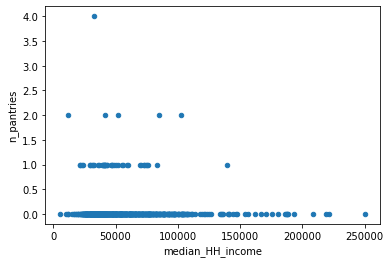

In [29]:
joinedDf2.plot.scatter('median_HH_income', 'n_pantries')

Looks like there is a relationship. It would be nice to add a best fit line. `seaborn` is a library that is built on `matplotlib`, but generally makes prettier plots and has more statistical functions.

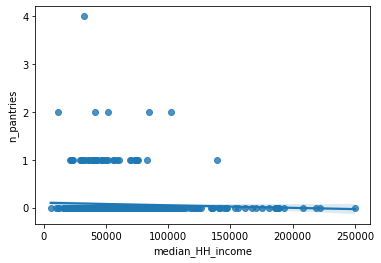

In [30]:
import seaborn as sns
ax = sns.regplot(x="median_HH_income", y="n_pantries", data=joinedDf2)

It looks like there is a very shallow slope. How you intepret that (need vs exclusion) is a question we can't answer with these data!

Before moving on, we can also answer the reverse question: what are the characteristics of census tracts that have no food pantries, one pantry, etc.

This is a task (again) for `groupby`. 

In [31]:
joinedDf2.groupby('n_pantries').median_HH_income.mean()

n_pantries
0.0    58002.693848
1.0    49607.100000
2.0    58285.200000
4.0    32455.000000
Name: median_HH_income, dtype: float64

## Recap
We did a lot of join operations. Let's recap to see what we did.

First, we joined the census data to the EnviroScreen data using `GEOID`.

<div>
   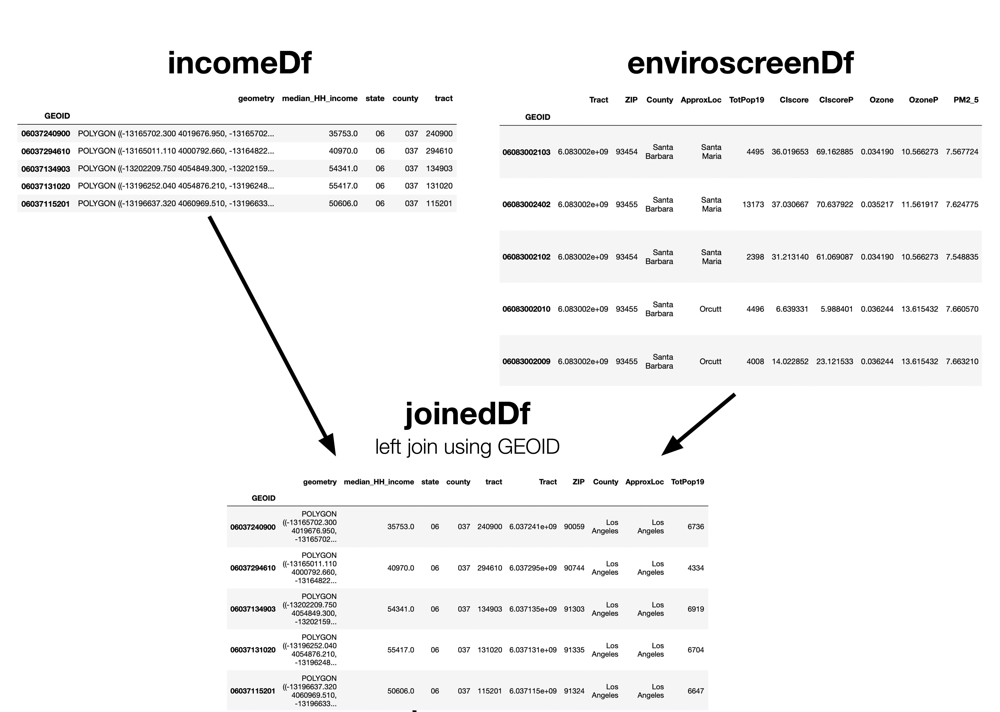
</div>

Then we did a spatial join to the pantry data.


<div>
   
</div>

Then we dropped the tracts with no pantries, and used `groupby` to get counts for the remaining census tracts.

<div>
   
</div>

Finally, we joined those counts back to the joined EnviroScreen and census dataframe, using `GEOID`.

<div>
   
</div>

<div class="alert alert-block alert-info">
<h3>Key Takeaways</h3>
<ul>
  <li>As we saw before, data wrangling needs trial and error.</li>
  <li>Spatial joins use the spatial relationships, rather than a common column. Intersect is the most common (e.g. points inside census tracts). </li>
  <li>Seaborn is a very similar library to matplotlib, but generally makes prettier plots and has more functions for statistical charts.</li>
</ul>
</div>